In [1]:
# 경고 메시지 설정, 중요한 무제만 출력

import warnings
warnings.filterwarnings("ignore")


In [2]:
# Pillow 패키지 설치
### pin install pillow

In [3]:
import tensorflow as tf
print(tf.__version__)

2.2.0


In [4]:
# dataset 설치
# https://www.tensorflow.org/datasets/catalog/overview
# 텐서플로우에서 제공하는 데이터 셋 설치
#  pip install tensorflow_datasets

In [5]:
import tensorflow_datasets as tfds

tfds.__version__

'3.2.1'

# data Load

In [6]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)
metadata

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

# data 다듬기

In [8]:
# 데이터 확인
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

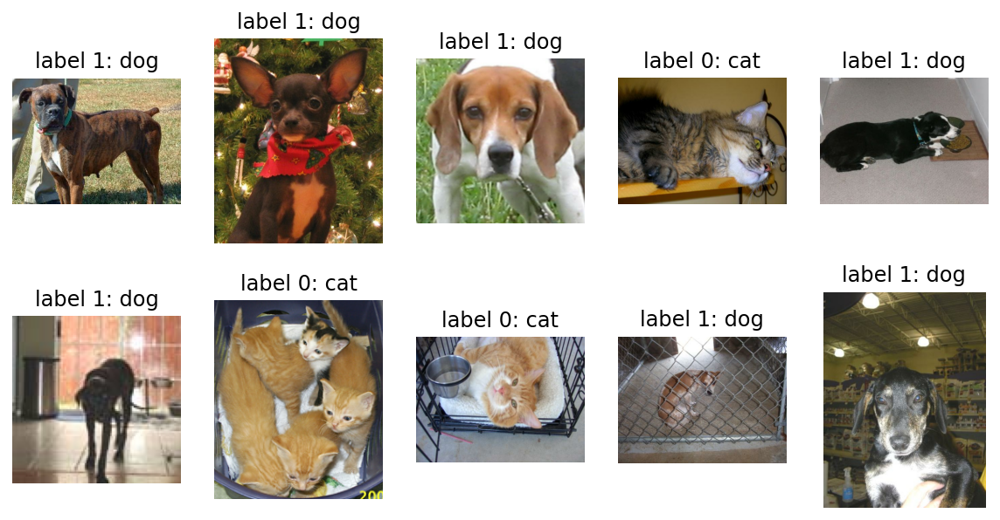

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [10]:
# 이미지 사이즈 통일, 픽셀 스케일 수정 함수 선언




IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 각 픽셀값의 데이터들을 127.5로 나누기 -1 빼면 값이 -1~1사이로 변한다
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) #160* 160으로 resize
    return image, label

In [11]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

In [12]:
train

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>

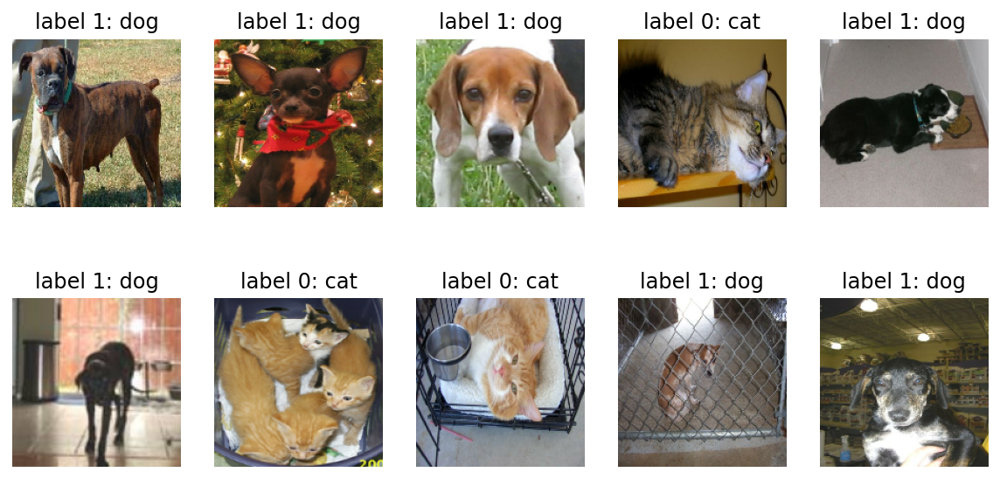

In [13]:
# 변환된 이미지 확인
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 모델 구조 설계

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [15]:
# model 
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])


In [16]:
#
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [17]:
## numpy 활용 원리 이해
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [18]:
image.flatten()

array([1, 2, 3, 4])

# 모델 compile

In [19]:
# 
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

### compile : optimizer / loss / metrics

- optimizer는 학습을 어떤 방식으로 시킬 것인지 결정합니다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 합니다.   
- loss는 모델이 학습해나가야 하는 방향을 결정합니다. 이 문제에서는 모델의 출력은 입력받은 이미지가 고양이인지 강아지인지에 대한 확률분포로 두었으므로, 입력이미지가 고양이(label=0)일 경우 모델의 출력이 [1.0, 0.0]에 가깝도록, 강아지(label=1)일 경우 [0.0, 1.0]에 가깝도록 하는 방향을 제시합니다.   
- metrics는 모델의 성능을 평가하는 척도입니다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있습니다.   

In [20]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [21]:
 # batch 사이즈 단위로 32개를 랜덤으로 뽑기
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)

validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [22]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

### 검증

In [23]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 27ms/step - loss: 0.7139 - accuracy: 0.4656
initial loss: 0.71
initial accuracy: 0.47


In [24]:
# loss  손실
# accuracy : 정확도


In [25]:
# epoch 조정
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 84s 145ms/step - loss: 0.5933 - accuracy: 0.6739 - val_loss: 0.6060 - val_accuracy: 0.6797
Epoch 2/10
582/582 [==============================] - 32s 55ms/step - loss: 0.4770 - accuracy: 0.7673 - val_loss: 0.5199 - val_accuracy: 0.7511
Epoch 3/10
582/582 [==============================] - 23s 40ms/step - loss: 0.4156 - accuracy: 0.8093 - val_loss: 0.4782 - val_accuracy: 0.7837
Epoch 4/10
582/582 [==============================] - 23s 40ms/step - loss: 0.3634 - accuracy: 0.8376 - val_loss: 0.4731 - val_accuracy: 0.7863
Epoch 5/10
582/582 [==============================] - 23s 40ms/step - loss: 0.3150 - accuracy: 0.8667 - val_loss: 0.4734 - val_accuracy: 0.7936
Epoch 6/10
582/582 [==============================] - 23s 40ms/step - loss: 0.2664 - accuracy: 0.8894 - val_loss: 0.4833 - val_accuracy: 0.7954
Epoch 7/10
582/582 [==============================] - 23s 40ms/step - loss: 0.2184 - accuracy: 0.9124 - val_loss: 0.5281 - val_accuracy

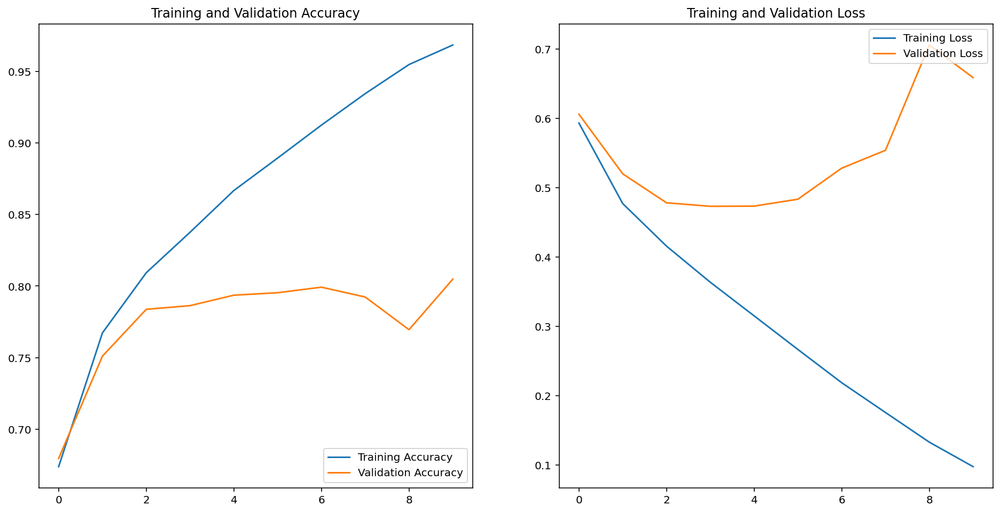

In [30]:
#

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [31]:
# 모델의 에측 결과 확인 pedict()

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions



array([[9.99961853e-01, 3.81686805e-05],
       [8.92288744e-01, 1.07711323e-01],
       [4.90053147e-01, 5.09946823e-01],
       [9.99996424e-01, 3.53335213e-06],
       [8.79976571e-01, 1.20023467e-01],
       [7.57495821e-01, 2.42504194e-01],
       [3.56556885e-02, 9.64344263e-01],
       [9.90584791e-01, 9.41518601e-03],
       [2.94081956e-01, 7.05918074e-01],
       [8.57258677e-01, 1.42741308e-01],
       [3.36558931e-02, 9.66344118e-01],
       [9.99999881e-01, 1.01654635e-07],
       [9.99845982e-01, 1.54015084e-04],
       [1.01193407e-04, 9.99898791e-01],
       [9.91664171e-01, 8.33581761e-03],
       [9.94556904e-01, 5.44311479e-03],
       [7.29098260e-01, 2.70901680e-01],
       [4.66511265e-05, 9.99953389e-01],
       [9.91882801e-01, 8.11717287e-03],
       [9.99986172e-01, 1.38078167e-05],
       [5.25508106e-01, 4.74491924e-01],
       [9.84747708e-01, 1.52522586e-02],
       [9.99673009e-01, 3.26963374e-04],
       [9.96810257e-01, 3.18968738e-03],
       [9.850465

In [28]:
## [ 고양이일 확률, 강아지일 확률]
## [1.0, 0.0] 에 가까우면 고양이 / [0.0, 1.0,] 에 가까우면 강아지

In [32]:
import numpy as np

## argmax : index array 가장큰수의 index 리턴 ,  axis: 축 기준 0 x ,1 y
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

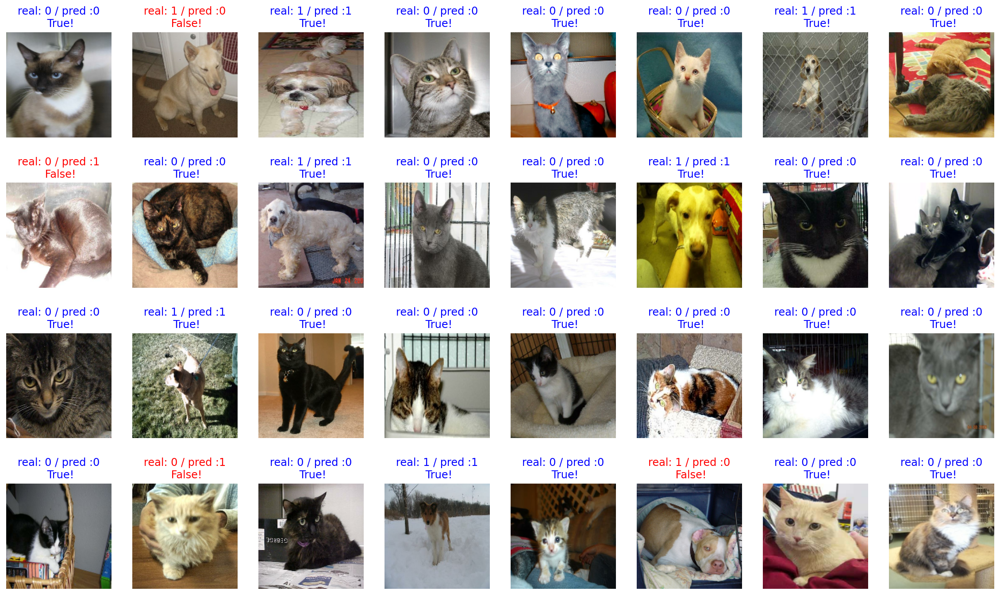

In [33]:
# 시각화

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [34]:
#32개 이미지에 대한 예측과 정확도


count = 0   # 정답을 맞춘 개수
print(labels)
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    #print(prediction) numpy.int64
    #print(label) tensorflow.python.framework.ops.EagerTensor
    
    if label == prediction :
        count += 1
    
print(count / 32 * 100)    # 약 70% 내외

tf.Tensor([0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0], shape=(32,), dtype=int64)
87.5


## model ref

-  ILSVRC, ImageNet이 무엇인지 알아보고, Transfer Learning

### transfer learning
- https://jeinalog.tistory.com/13

### CNN

- Convolutional base   
합성곱층과 풀링층이 여러겹 쌓여있는 부분입니다. convolutional base의 목표는 이미지로부터 특징을 효과적으로 추출하는 것 (feature extraction) 입니다. 합성곱층과 풀링층에 대한 직관적인 설명을 보시려면 Chollet (2017) 논문을 참고하세요.
ㅤ

- Classifier   
주로 완전 연결 계층 (fully connected layer)로 이루어져 있습니다. 완전 연결 계층이란 모든 계층의 뉴런이 이전 층의 출력 노드와 하나도 빠짐없이 모두 연결되어 있는 층을 말합니다. 분류기(Classifier)의 최종 목표는 추출된 특징을 잘 학습해서 이미지를 알맞은 카테고리로 분류하는 것 (image classification) 입니다.


#### fine tune
1. 전체 모델을 새로 학습하기
2. convolution base의 일부분을 고정, 나머지 계층과 classifier로 새로 학습시키기
3. Convloutional base는 고정시키고, classifier만 새로 학습시키기
ㅤ

#### 전이 학습 과정

1. 사전학습 모델 선택
2. 내 문제와 데이터크기-유사성 그래프에서 어떤 부분에 속하는지 인지

3. 내모델이 fine tuning

![n](imgs/00-fine_tune4.png)


4. classifier 

 1) Fully connect layer   
    완전 연결 계층을 쌓은 후 마지막에 소프트맥스 활성화함수(softmax activated layer) 계층을 놓음
    
 2) global average polling   
    평균 풀링계층을 추가하고, 그 결과값을 바로 소프트맥스 계층과 연결
 
 3) linear support vactor machines   
    선형 서포트 벡터 머신(SVM)


## VGG16 모델 사용해보기

- https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16

In [35]:
#

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [36]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [37]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [38]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [39]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
#flatten layer

In [40]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


### Global Average Pooling

 - https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/2d-global-average-pooling

In [41]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [42]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [43]:
# dense layer 붙이기

In [44]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [45]:
# vgg16 에 해당하는 ase_model은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 trainable 변수를 False

In [46]:
base_model.trainable = False

In [47]:
# 최종 모델 정의

In [48]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [49]:
# optimizer loss metrics 셋팅 후 compile

In [50]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [51]:
# 학습전.....
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 57ms/step - loss: 0.8881 - accuracy: 0.4703
initial loss: 0.89
initial accuracy: 0.47


In [52]:
# 학습실시 
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 95s 164ms/step - loss: 0.2495 - accuracy: 0.9089 - val_loss: 0.1699 - val_accuracy: 0.9334
Epoch 2/5
582/582 [==============================] - 50s 85ms/step - loss: 0.1587 - accuracy: 0.9366 - val_loss: 0.1631 - val_accuracy: 0.9342
Epoch 3/5
582/582 [==============================] - 50s 85ms/step - loss: 0.1452 - accuracy: 0.9402 - val_loss: 0.1667 - val_accuracy: 0.9316
Epoch 4/5
582/582 [==============================] - 50s 87ms/step - loss: 0.1380 - accuracy: 0.9432 - val_loss: 0.1420 - val_accuracy: 0.9377
Epoch 5/5
582/582 [==============================] - 50s 87ms/step - loss: 0.1332 - accuracy: 0.9462 - val_loss: 0.1387 - val_accuracy: 0.9441


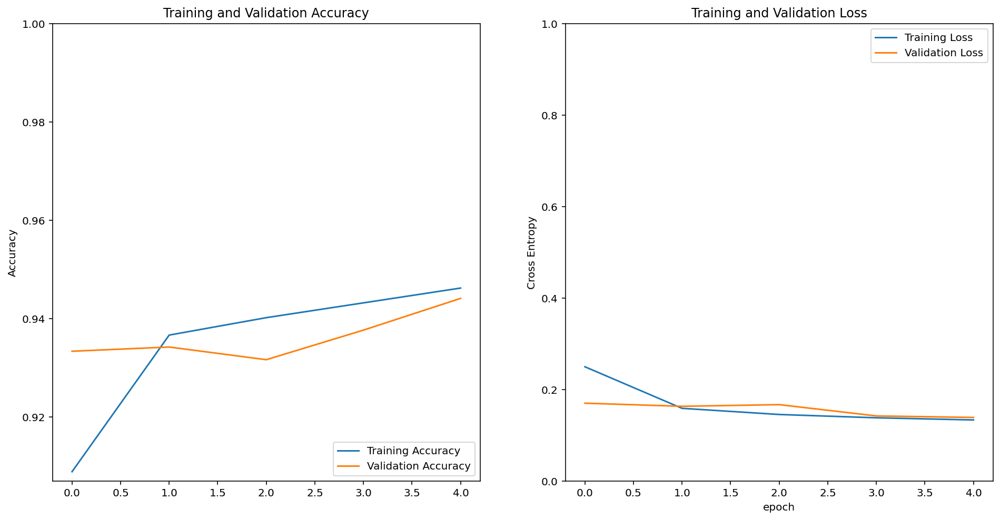

In [53]:
# 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [54]:
# 예측결과 0-1
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99989629e-01, 1.03655175e-05],
       [1.05683804e-01, 8.94316196e-01],
       [3.12774986e-01, 6.87224984e-01],
       [9.99995589e-01, 4.45455498e-06],
       [9.97918427e-01, 2.08156556e-03],
       [9.83218729e-01, 1.67812165e-02],
       [2.04670781e-04, 9.99795377e-01],
       [6.05710745e-01, 3.94289225e-01],
       [9.47175026e-01, 5.28249927e-02],
       [9.60122466e-01, 3.98775600e-02],
       [5.70734483e-05, 9.99942899e-01],
       [9.99953151e-01, 4.67913778e-05],
       [9.88173842e-01, 1.18260859e-02],
       [3.76671824e-06, 9.99996185e-01],
       [9.98510778e-01, 1.48916559e-03],
       [9.84404981e-01, 1.55950412e-02],
       [9.96540964e-01, 3.45901074e-03],
       [2.34856922e-02, 9.76514280e-01],
       [6.29351377e-01, 3.70648593e-01],
       [9.94573295e-01, 5.42670628e-03],
       [9.14507210e-01, 8.54927748e-02],
       [9.74579215e-01, 2.54207384e-02],
       [9.93597388e-01, 6.40263502e-03],
       [9.81304824e-01, 1.86951775e-02],
       [9.976704

In [55]:
# 라벨 변환 0 1
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

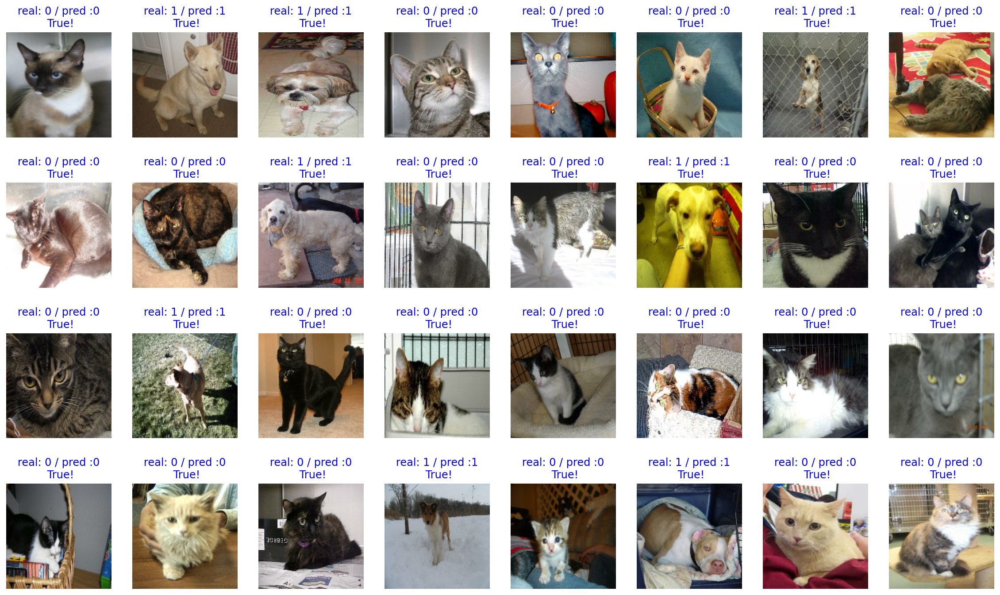

In [56]:
# 결과 확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

## 모델저장

In [57]:
import os

checkpoint_dir =  ".cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


### 이미지

In [65]:
# 이미지 폴더 조회
img_dir_path = "./cat_vs_dog/images"

os.path.exists(img_dir_path)

#

True

In [66]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

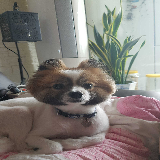

In [68]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'myDog01.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [69]:
# 자료 변환
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [70]:
#예측 실시
prediction = model.predict(dog_image)
prediction

array([[3.239567e-19, 1.000000e+00]], dtype=float32)

In [133]:
## 함수로 정의
from decimal import *
import math
    
    
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    
    
    
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100, 5)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100.0% dog, and 0.0% cat.


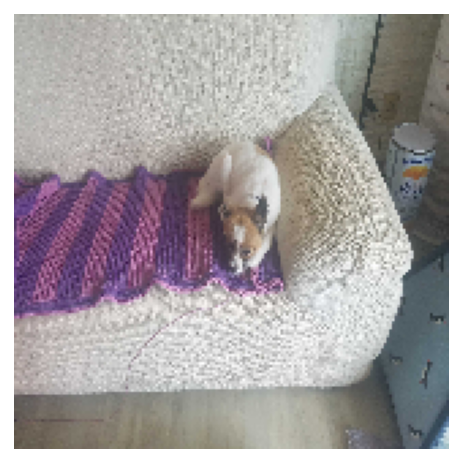

In [134]:
filename = 'myDog02.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


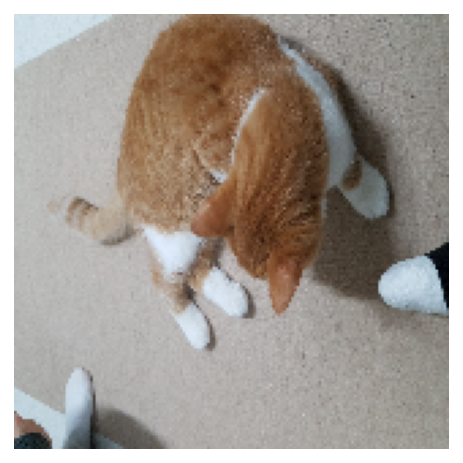

In [135]:
filename = 'myCat01.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


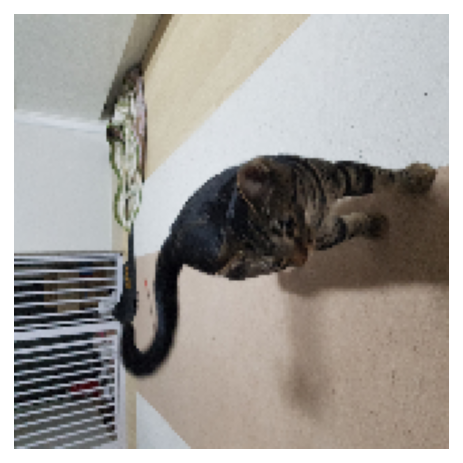

In [136]:
filename = "myCat02.jpg"
show_and_predict_image(img_dir_path, filename)